# WINE TASTING BASED ON DESCRIPTIONS - (EDA/NLP) 

How could wines be best described?

Blinded wine tasting is wine tasting undertaken in circumstances in which the tasters are kept unaware of the wines' identities. The blind approach is routine for wine professionals (wine tasters, sommeliers and others) who wish to ensure impartiality in the judgment of the quality of wine during wine competitions or in the evaluation of a sommelier for professional certification. 

Trained tasters use a grid as a system to mentally separate aromas, flavors, and tastes to reveal the identity of a wine.

Wine speak has a special language all of its own. One of the obstacles we face in the world of wine is trying to understand what's inside the bottle.  

Wine labels are confusing. They're different in almost every single country and producers vary from providing a veritable mountain of technical information on the label, to almost none at all. 

In this notebook, I will create an analysis to better understand wine descriptions based on the variety, winery and location. The dataset I will be using is the Wine Reviews dataset from Kaggle and it contains wine reviews with variety, location, winery, price, points and description.

Let's get started!

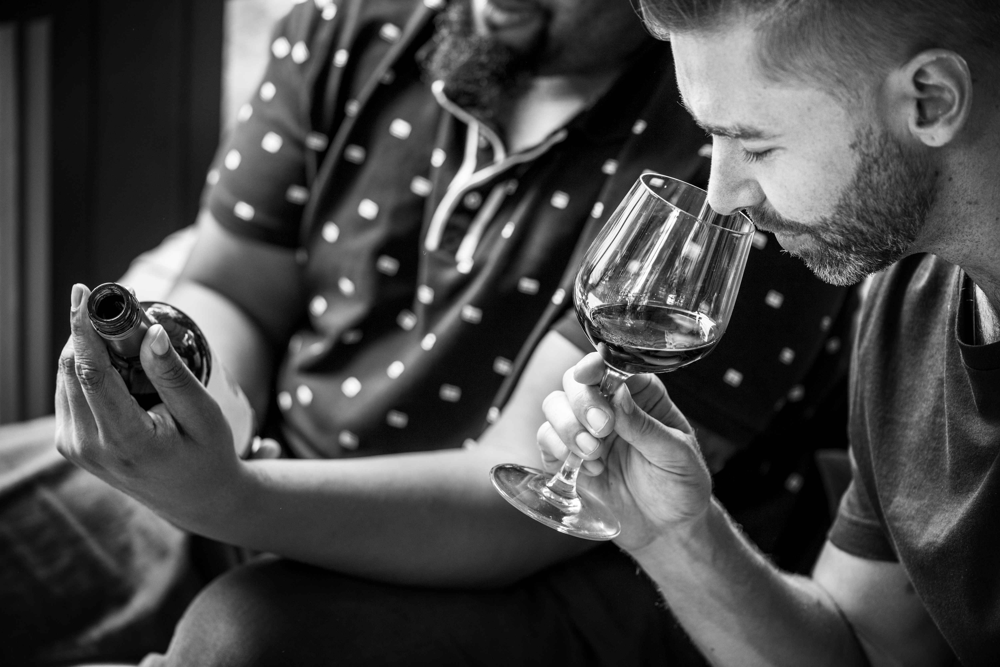

# Table of Contents

[1. Import Libraries](#1)

[2. Import Dataset](#2)

[3. Exploratory Data Analysis](#3)
- [View dimensions of dataset](#3.1)
- [Preview the dataset](#3.2)
- [View column names](#3.3)
- [View summary of dataset](#3.4)
- [View statistical properties of the dataset](#3.5)
- [Check missing values](#3.6)

[4. Locations](#4)
- [View unique Countries](#4.1)
- [Visualize the number of unique Countries](#4.2)
- [Visualize the number of unique Provinces](#4.3)

[5. Wineries](#5)
- [View the number of unique Wineries](#5.1)
- [Visualize the number of unique Wineries](#5.2)
- [Visualize the distribution of wineries](#5.3)
- [View the number and distribution of Wineries](#5.4)
- [Visualize the Top 5 Wineries](#5.5)
- [View the percentage distribution of Wineries](#5.6)

[6. Varieties](#6)
- [View the varieties of wine](#6.1)
- [Visualize the varieties of wine](#6.2)

[7. Descriptions](#7)
- [View the variety and description of the first 20 wines](#7.1)
- [Top 10 most described variety](#7.2)

[8. Wordcloud of Descriptions](#8)
- [Stopwords in the description column](#8.1)
- [Wordcloud of descriptions](#8.2)
- [Words from the best wines](#8.3)
- [Wordcloud of descriptions - best wines](#8.4)
- [Stopword Removal using NLTK](#8.5)
- [Filtering Words](#8.6)
- [Final descriptive words - best wines](#8.7)
- [Top 20 descriptive words from the best wines](#8.8)

# 1. Import Libraries  <a class="anchor" id="1"></a>

In [301]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud,STOPWORDS
import nltk

# 2. Import Dataset <a class="anchor" id="2"></a>

In [302]:
data = '/Users/sakaride-meis/documents/winemag-data-130k-v2.csv'
df = pd.read_csv(data)

# 3. Exploratory Data Analysis <a class="anchor" id="3"></a>

**View dimensions of dataset** <a class="anchor" id="3.1"></a>

In [143]:
df.shape

(129971, 14)

There are 129971 records and 14 columns

**Preview the dataset** <a class="anchor" id="3.2"></a>

In [144]:
df.head

<bound method NDFrame.head of         Unnamed: 0   country  \
0                0     Italy   
1                1  Portugal   
2                2        US   
3                3        US   
4                4        US   
...            ...       ...   
129966      129966   Germany   
129967      129967        US   
129968      129968    France   
129969      129969    France   
129970      129970    France   

                                              description  \
0       Aromas include tropical fruit, broom, brimston...   
1       This is ripe and fruity, a wine that is smooth...   
2       Tart and snappy, the flavors of lime flesh and...   
3       Pineapple rind, lemon pith and orange blossom ...   
4       Much like the regular bottling from 2012, this...   
...                                                   ...   
129966  Notes of honeysuckle and cantaloupe sweeten th...   
129967  Citation is given as much as a decade of bottl...   
129968  Well-drained gravel soil giv

**View column names** <a class="anchor" id="3.3"></a>

In [145]:
col_names = df.columns
col_names

Index(['Unnamed: 0', 'country', 'description', 'designation', 'points',
       'price', 'province', 'region_1', 'region_2', 'taster_name',
       'taster_twitter_handle', 'title', 'variety', 'winery'],
      dtype='object')

**View summary of dataset** <a class="anchor" id="3.4"></a>

In [146]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             129971 non-null  int64  
 1   country                129908 non-null  object 
 2   description            129971 non-null  object 
 3   designation            92506 non-null   object 
 4   points                 129971 non-null  int64  
 5   price                  120975 non-null  float64
 6   province               129908 non-null  object 
 7   region_1               108724 non-null  object 
 8   region_2               50511 non-null   object 
 9   taster_name            103727 non-null  object 
 10  taster_twitter_handle  98758 non-null   object 
 11  title                  129971 non-null  object 
 12  variety                129970 non-null  object 
 13  winery                 129971 non-null  object 
dtypes: float64(1), int64(2), object(11)


The dataset contains a mixture of categorical(object) and numerical(int64, float64) variables.

**View statistical properties of the dataset** <a class="anchor" id="3.5"></a>

In [147]:
df.describe()
# df.describe() excludes the character properties. 

,Unnamed: 0,points,price
count,129971.000000,129971.000000,120975.000000
mean,64985.000000,88.447138,35.363389
std,37519.540256,3.039730,41.022218
min,0.000000,80.000000,4.000000
25%,32492.500000,86.000000,17.000000
50%,64985.000000,88.000000,25.000000
75%,97477.500000,91.000000,42.000000
max,129970.000000,100.000000,3300.000000


- The value of points are distributed between 80 and 100.
- It's interesting to note the high price difference from 4 to 3300.

In [148]:
# To also observe character properties
df.describe(include=['object'])

,country,description,designation,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
count,129908,129971,92506,129908,108724,50511,103727,98758,129971,129970,129971
unique,43,119955,37979,425,1229,17,19,15,118840,707,16757
top,US,"Stalky aromas suggest hay and green herbs, wit...",Reserve,California,Napa Valley,Central Coast,Roger Voss,@vossroger,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Pinot Noir,Wines & Winemakers
freq,54504,3,2009,36247,4480,11065,25514,25514,11,13272,222


**Check missing values**  <a class="anchor" id="3.6"></a>

In [149]:
df['variety'].isnull().sum()

1

In [150]:
df['description'].isnull().sum()

0

# 4. Locations <a class="anchor" id="4"></a>

**View unique Countries**  <a class="anchor" id="4.1"></a>

In [151]:
df['country'].unique()

array(['Italy', 'Portugal', 'US', 'Spain', 'France', 'Germany',
       'Argentina', 'Chile', 'Australia', 'Austria', 'South Africa',
       'New Zealand', 'Israel', 'Hungary', 'Greece', 'Romania', 'Mexico',
       'Canada', nan, 'Turkey', 'Czech Republic', 'Slovenia',
       'Luxembourg', 'Croatia', 'Georgia', 'Uruguay', 'England',
       'Lebanon', 'Serbia', 'Brazil', 'Moldova', 'Morocco', 'Peru',
       'India', 'Bulgaria', 'Cyprus', 'Armenia', 'Switzerland',
       'Bosnia and Herzegovina', 'Ukraine', 'Slovakia', 'Macedonia',
       'China', 'Egypt'], dtype=object)

**Visualize the number of unique Countries**  <a class="anchor" id="4.2"></a>

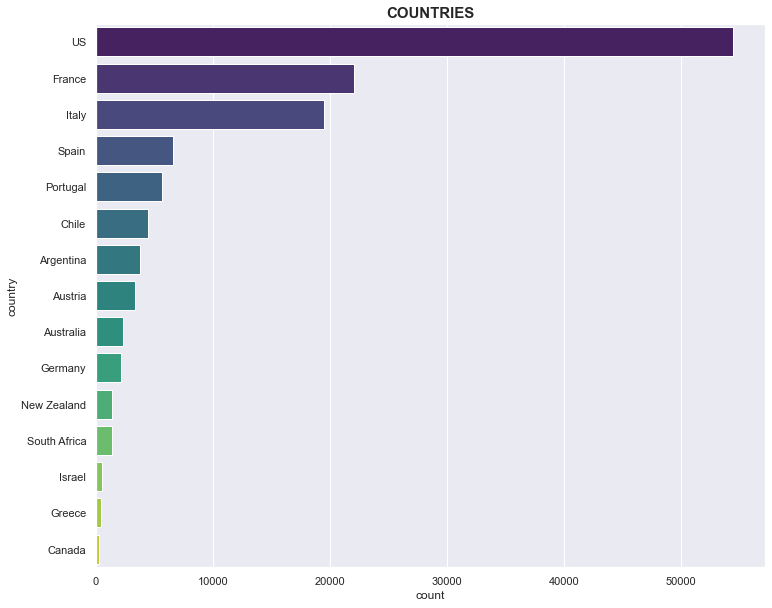

In [152]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="country", data=df, palette="viridis", order=df['country'].value_counts().index[0:15])

plt.title('COUNTRIES', fontsize=15, fontweight='bold')
plt.show()

**Visualize the number of unique Provinces**  <a class="anchor" id="4.3"></a>

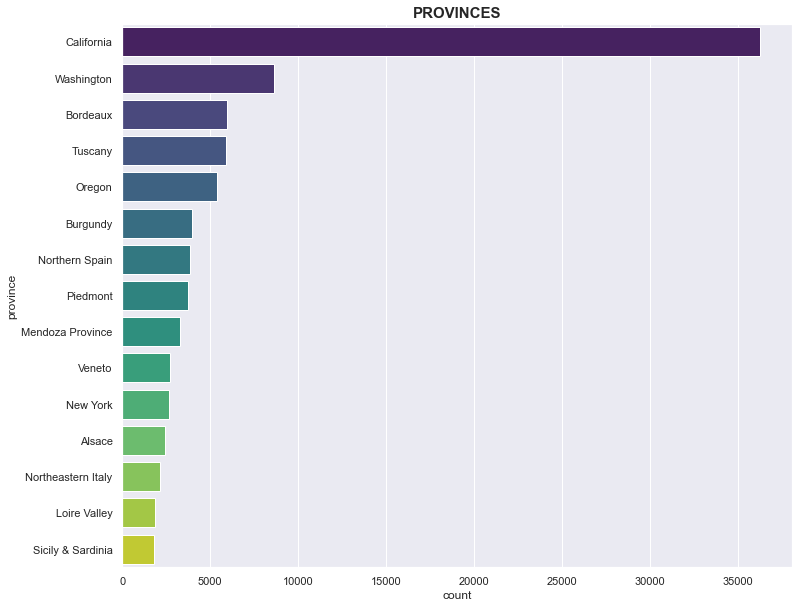

In [303]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="province", data=df, palette="viridis", order=df['province'].value_counts().index[0:15])

plt.title('PROVINCES', fontsize=15, fontweight='bold')
plt.show()

# 5. Wineries <a class="anchor" id="5"></a>

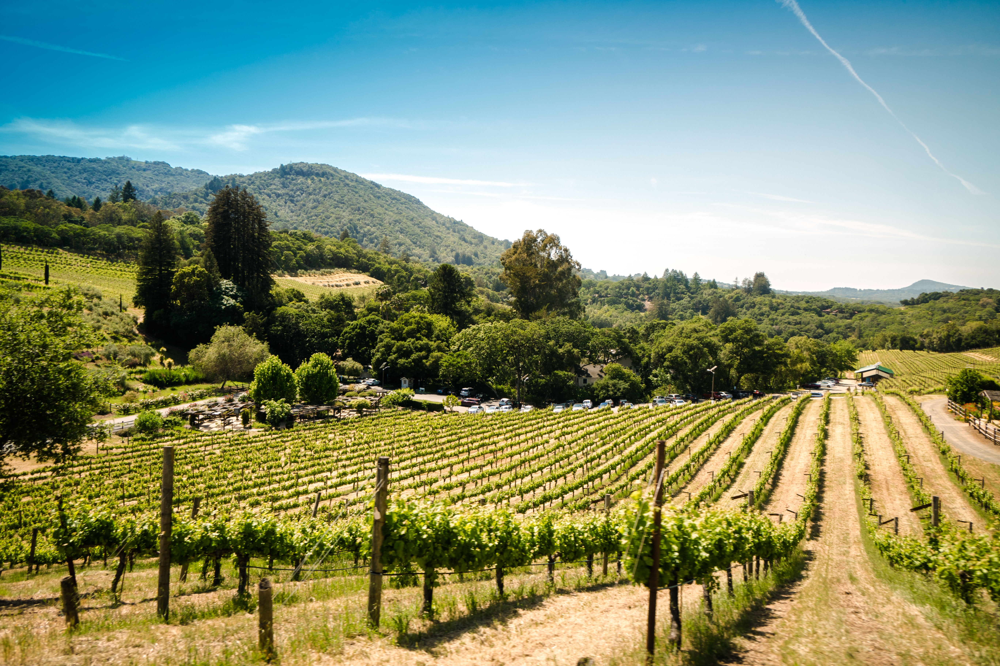

**View the number of unique Wineries**  <a class="anchor" id="5.1"></a>

In [154]:
df['winery'].nunique()

16757

**Visualize the number of unique Wineries**  <a class="anchor" id="5.2"></a>

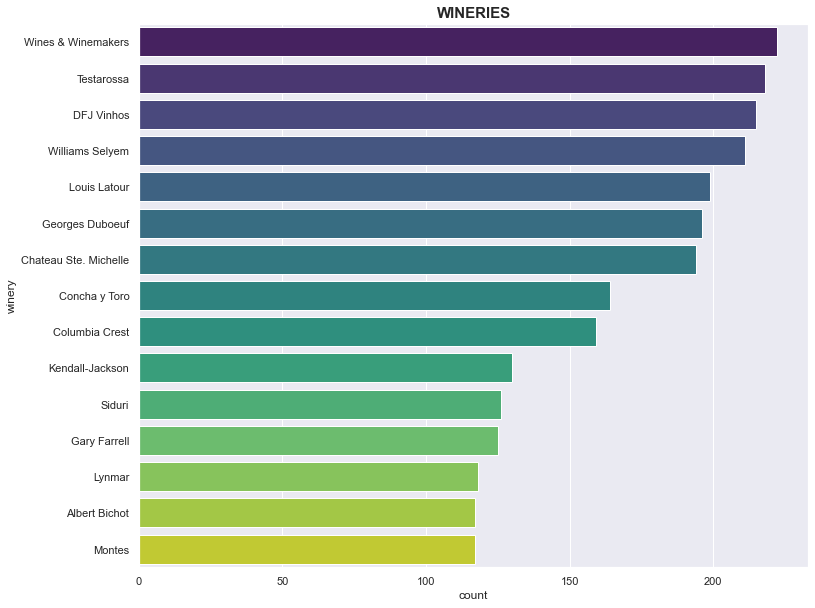

In [155]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="winery", data=df, palette="viridis", order=df['winery'].value_counts().index[0:15])

plt.title('WINERIES', fontsize=15, fontweight='bold')
plt.show()

**Visualize the distribution of wineries**  <a class="anchor" id="5.3"></a>

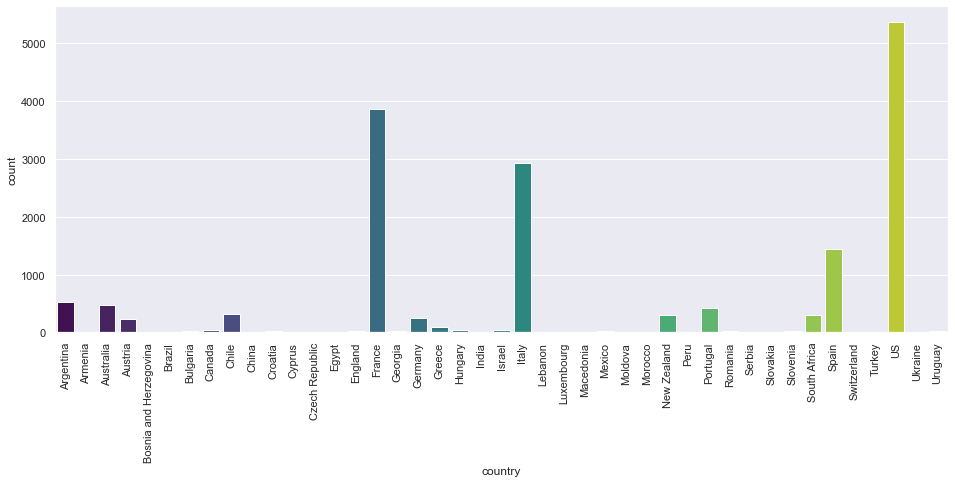

In [156]:
plt.figure(figsize = (16,6))
cnt = df.groupby(['country','winery',]).count().reset_index()
sns.countplot(x = cnt['country'], palette='viridis')
plt.xticks(rotation = 90);

**View the number and distribution of Wineries**  <a class="anchor" id="5.4"></a>

In [157]:
df['winery'].value_counts()

Wines & Winemakers    222
Testarossa            218
DFJ Vinhos            215
Williams Selyem       211
Louis Latour          199
                     ... 
Ozwell Vintners         1
Domaine de Beaupré      1
Château Lanscade        1
Château Loirac          1
Gordonzello             1
Name: winery, Length: 16757, dtype: int64

**Visualize the Top 5 Wineries**  <a class="anchor" id="5.5"></a>

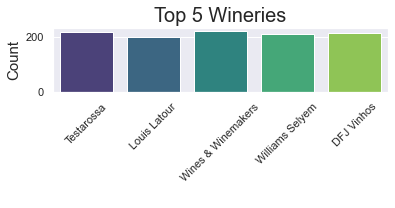

In [158]:
winery = df.winery.value_counts()[:5]
plt.subplot(3,1,1)
g = sns.countplot(x='winery', data=df.loc[(df.winery.isin(winery.index.values))], palette='viridis')
g.set_title('Top 5 Wineries', fontsize=20)
g.set_xlabel(" ", fontsize=15)
g.set_ylabel('Count', fontsize=15)
g.set_xticklabels(g.get_xticklabels(),rotation=45)
plt.show()

**View the percentage distribution of Wineries**  <a class="anchor" id="5.6"></a>

In [159]:
df['winery'].value_counts()/len(df)

Wines & Winemakers    0.001708
Testarossa            0.001677
DFJ Vinhos            0.001654
Williams Selyem       0.001623
Louis Latour          0.001531
                        ...   
Ozwell Vintners       0.000008
Domaine de Beaupré    0.000008
Château Lanscade      0.000008
Château Loirac        0.000008
Gordonzello           0.000008
Name: winery, Length: 16757, dtype: float64

# 6. Varieties <a class="anchor" id="6"></a>

**View the varieties of wine**  <a class="anchor" id="6.1"></a>

In [305]:
df['variety']

0            White Blend
1         Portuguese Red
2             Pinot Gris
3               Riesling
4             Pinot Noir
               ...      
129966          Riesling
129967        Pinot Noir
129968    Gewürztraminer
129969        Pinot Gris
129970    Gewürztraminer
Name: variety, Length: 129971, dtype: object

**Visualize the varieties of wine**  <a class="anchor" id="6.2"></a>

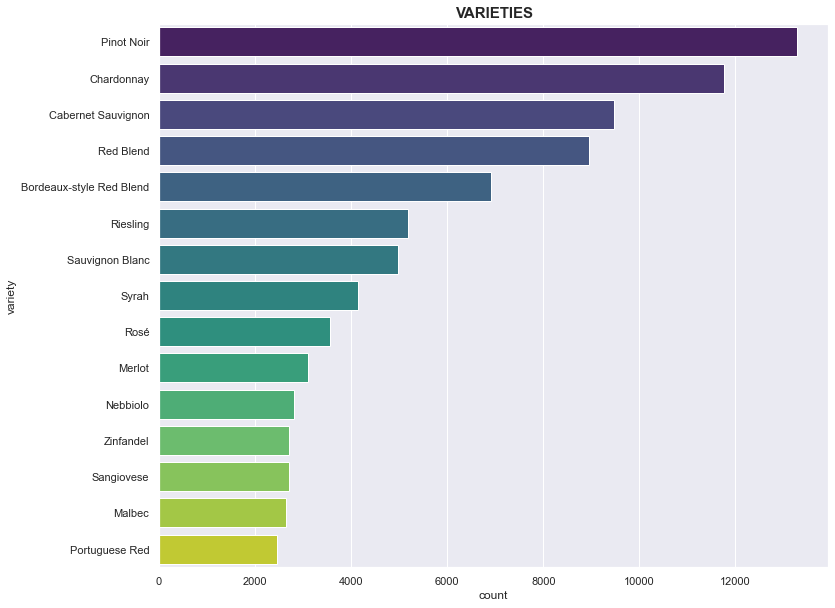

In [162]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="variety", data=df, palette="viridis", order=df['variety'].value_counts().index[0:15])

plt.title('VARIETIES', fontsize=15, fontweight='bold')
plt.show()

# 7. Descriptions <a class="anchor" id="7"></a>

**View the variety and description of the first 20 wines**  <a class="anchor" id="7.1"></a>

In [163]:
df = df[['description', 'variety']]
df.head(20)

,description,variety
0,"Aromas include tropical fruit, broom, brimston...",White Blend
1,"This is ripe and fruity, a wine that is smooth...",Portuguese Red
2,"Tart and snappy, the flavors of lime flesh and...",Pinot Gris
3,"Pineapple rind, lemon pith and orange blossom ...",Riesling
4,"Much like the regular bottling from 2012, this...",Pinot Noir
5,Blackberry and raspberry aromas show a typical...,Tempranillo-Merlot
6,"Here's a bright, informal red that opens with ...",Frappato
7,This dry and restrained wine offers spice in p...,Gewürztraminer
8,Savory dried thyme notes accent sunnier flavor...,Gewürztraminer
9,This has great depth of flavor with its fresh ...,Pinot Gris


**Top 10 most described variety** <a class="anchor" id="7.2"></a>

In [172]:
var_df = df.variety.value_counts()
var_df.head(10)

Pinot Noir                  13272
Chardonnay                  11753
Cabernet Sauvignon           9472
Red Blend                    8946
Bordeaux-style Red Blend     6915
Riesling                     5189
Sauvignon Blanc              4967
Syrah                        4142
Rosé                         3564
Merlot                       3102
Name: variety, dtype: int64

# 8. Wordcloud of Descriptions <a class="anchor" id="8"></a>

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

**Stopwords in the description column** <a class="anchor" id="8.1"></a>

In [256]:
desc = ' '.join(i for i in df.description)

def convert(word):
    words = word.split(" ")
    return words

words = convert(desc)

print('There are {} words in the description column.'.format(len(words)))

There are 5248806 words in the description column.


**Wordcloud of descriptions** <a class="anchor" id="8.2"></a>

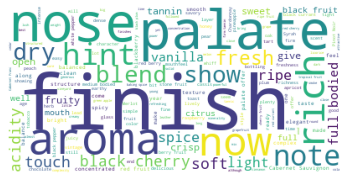

In [283]:
stopwords = set(STOPWORDS)
stopwords.update(['drink', 'wine', 'flavor', 'flavors'])

wordcloud = WordCloud(stopwords=stopwords, background_color='white').generate(desc)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

**Words from the best wines** <a class="anchor" id="8.3"></a>

In [287]:
best_wine = df[df['points'] > 97]

best_desc = ' '.join(i for i in best_wine.description)


def convert(word):
    words = word.split(" ")
    return words

best_words = convert(best_desc)

print('There are {} words in the Description column.'.format(len(best_words)))

There are 8022 words in the Description column.


**Wordcloud of descriptions - best wines** <a class="anchor" id="8.4"></a>

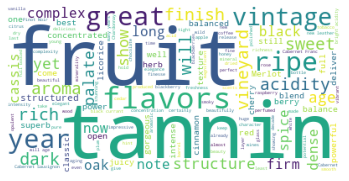

In [289]:
stopwords = set(STOPWORDS)
stopwords.update(['drink', 'wine', 'flavor', 'flavours'])

wordcloud = WordCloud(stopwords=stopwords, background_color='white').generate(best_desc)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [290]:
df = pd.DataFrame(best_words)
df.value_counts()

and            446
the            294
of             267
a              190
is             147
              ... 
acclaimed        1
includes         1
include          1
incarnation      1
get-out,         1
Length: 2413, dtype: int64

**Stopword Removal using NLTK** <a class="anchor" id="8.5"></a>

In [291]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

excluded = set(stopwords.words('english'))
included = word_tokenize(best_desc)
print(word_tokenize(best_desc)[:100])

filtered = [new for new in included if not new in excluded]

filtered = []

for new in included:
    if new not in excluded:
        filtered.append(new)


['This', 'wine', 'contains', 'some', 'material', 'over', '100', 'years', 'old', ',', 'but', 'shows', 'no', 'signs', 'of', 'fragility', '.', 'Instead', ',', 'it', "'s", 'concentrated', 'through', 'age', 'and', 'should', 'hold', 'in', 'the', 'bottle', 'indefinitely', '.', 'It', "'s", 'dark', 'coffee-brown', 'in', 'color', ',', 'with', 'delectable', 'aromas', 'of', 'rancio', ',', 'dried', 'fig', ',', 'molasses', 'and', 'black', 'tea', ',', 'yet', 'despite', 'enormous', 'concentration', 'avoids', 'excessive', 'weight', '.', 'And', 'it', "'s", 'amazingly', 'complex', 'and', 'fresh', 'on', 'the', 'nearly', 'endless', 'finish', '.', 'This', 'deep', 'brown', 'wine', 'smells', 'like', 'a', 'damp', ',', 'mossy', 'cave', '.', 'Then', 'add', 'complex', 'rancio', 'notes', ',', 'plus', 'maple', 'syrup', 'and', 'molasses', '.', 'It', "'s"]


**Filtering Words** <a class="anchor" id="8.6"></a>

In [292]:
print(len(filtered))

6660


Filtered length = 6660

In [293]:
print(filtered)

['This', 'wine', 'contains', 'material', '100', 'years', 'old', ',', 'shows', 'signs', 'fragility', '.', 'Instead', ',', "'s", 'concentrated', 'age', 'hold', 'bottle', 'indefinitely', '.', 'It', "'s", 'dark', 'coffee-brown', 'color', ',', 'delectable', 'aromas', 'rancio', ',', 'dried', 'fig', ',', 'molasses', 'black', 'tea', ',', 'yet', 'despite', 'enormous', 'concentration', 'avoids', 'excessive', 'weight', '.', 'And', "'s", 'amazingly', 'complex', 'fresh', 'nearly', 'endless', 'finish', '.', 'This', 'deep', 'brown', 'wine', 'smells', 'like', 'damp', ',', 'mossy', 'cave', '.', 'Then', 'add', 'complex', 'rancio', 'notes', ',', 'plus', 'maple', 'syrup', 'molasses', '.', 'It', "'s", 'full', ',', 'round', 'harmonious', ',', 'wonderfully', 'rich', 'yet', 'without', 'sense', 'heaviness', 'long', 'bright', 'finish', '.', 'The', 'flagship', 'wine', 'Quilceda', 'Creek', 'offers', 'exotic', 'scents', 'plum', ',', 'cassis', ',', 'loam', ',', 'coffee', 'pine', 'sap', ',', 'rich', 'evocative', 'bl

In [294]:
filtered = pd.DataFrame(filtered)
filtered.columns = ['words']
filtered.value_counts()

words       
,               742
.               507
wine            156
's               99
The              80
               ... 
include           1
incarnation       1
Only              1
impressively      1
float             1
Length: 1883, dtype: int64

In [295]:
final = filtered[filtered['words'].str.len().gt(3)]
final.value_counts()

words  
wine       156
tannins     56
This        54
flavors     46
years       45
          ... 
ginger       1
get-out      1
genuine      1
gently       1
1,600        1
Length: 1764, dtype: int64

**Final descriptive words - best wines** <a class="anchor" id="8.7"></a>

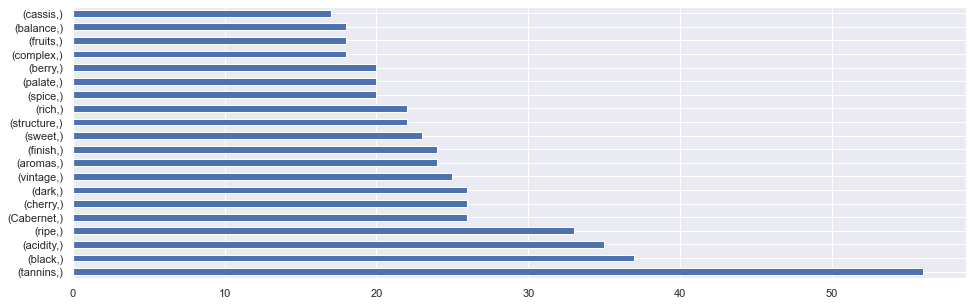

In [298]:
final = final[final.words != 'This']
final = final[final.words != 'wine']
final = final[final.words != 'years']
final = final[final.words != 'fruit']

final.value_counts(ascending=False).head(20).plot.barh(figsize=(16,5))
plt.ylabel('')
plt.show()

**Top 20 descriptive words from the best wines** <a class="anchor" id="8.8"></a>

The top 20 descriptive words for taken from the best wines are as follows:

- 1. TANNINS
- 2. BLACK
- 3. ACIDITY
- 4. RIPE
- 5. CABERNET
- 6. CHERRY
- 7. DARK
- 8. VINTAGE
- 9. AROMAS
- 10. FINISH
- 11. SWEET
- 12. STRUCTURE
- 13. RICH
- 14. SPICE
- 15. PALATE
- 16. BERRY
- 17. COMPLEX
- 18. FRUITS
- 19. BALANCE
- 20. CASSIS